Mode of the converted image:  L
Original Image: 


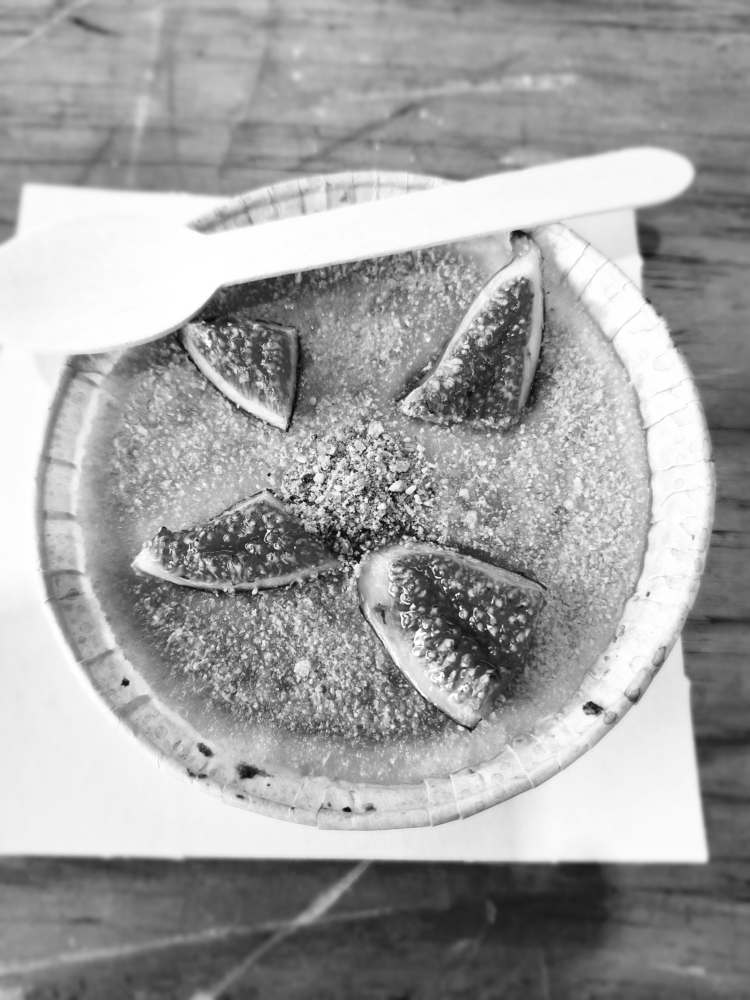

Converted Image With Downsized Pixel: 


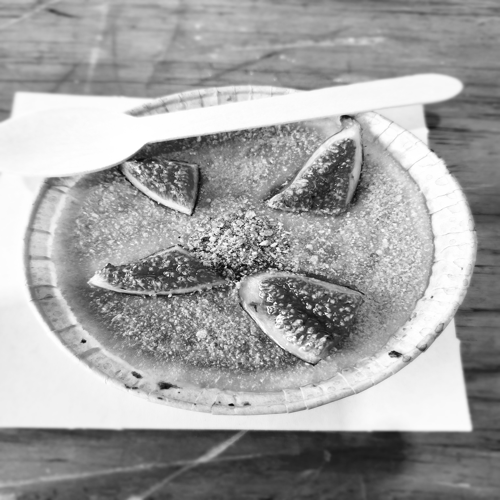

In [4]:
# Converting a photo from 24-bit to 8-bit
# Import image from the pillow library for display
# IPython.display is to show photos in Jupyter notebook, not in Photos app
from IPython.display import display
from PIL import Image

# Load an image file
im = Image.open(r'Picture for Final Project (original).jpg')

# Convert the image to grayscale and 8-bit
converted_image = im.convert("L")

# change the photo to 500 x 500 pixel
converted_image_pixel = converted_image.resize((500,500))

# Save the grayscale image
converted_image_pixel.save("Picture for Final Project 500.png", "PNG")

# Display the image mode
print("Mode of the converted image: ", converted_image_pixel.mode)

# Display the image
print("Original Image: ")
display(im)

print("Converted Image With Downsized Pixel: ")
display(converted_image_pixel)

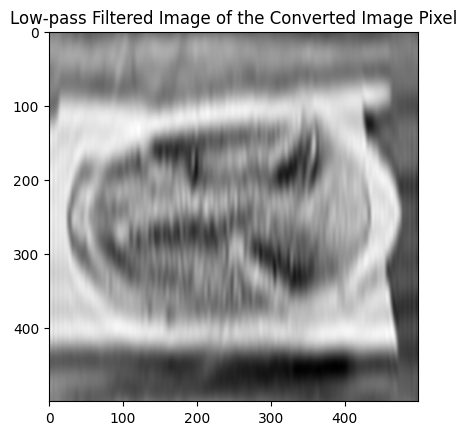

Blurred Image Downsized to 250x250 Pixel: 


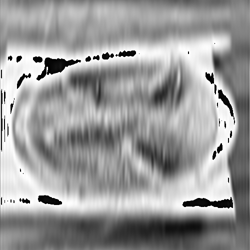

In [16]:
# Now the image has been converted to the appropriate file of 8-bit, grayscale, in 500 x 500 pixel, it's time to blur the image

# Import the following
# cv2 is from the opencv_python
# matplotlib.pyplot is for plotting
import numpy as np
import cv2
import requests
import matplotlib.pyplot as plt
from io import BytesIO

# Low-pass filtering will be used to blur the image (Fourier Transform)

# Take the image URL (use the raw link)
url = "https://raw.githubusercontent.com/resolver13/Monash-bootcamp/Bootcamp-Monash/Picture%20for%20Final%20Project%20500.png"

# Fetch the image from the URL
response = requests.get(url)
img_data = response.content

# Open the image using PIL
img = Image.open(BytesIO(img_data))

# Compute FFT (Remember to use converted_image_pixel from the previous box)
# As converted_image_pixel is a PIL image object, there is no shape attribute
# Therefore, it needs to be converted into numpy format
converted_image_pixel_np = np.array(converted_image_pixel)
f = np.fft.fft2(converted_image_pixel_np)
fshift = np.fft.fftshift(f)

# Create a mask with a low-pass filter
rows, cols = converted_image_pixel_np.shape
crow, ccol = rows // 2, cols // 2
mask = np.zeros((rows, cols), np.uint8)
mask[crow-10:crow+10, ccol-80:ccol+80] = 1   # This creates a simple low-pass filter mask
                                             # Lower number in ccol and crow makes the blurring more apparent

# Apply mask and inverse FFT
fshift_masked = fshift * mask
f_ishift = np.fft.ifftshift(fshift_masked)
image_filtered = np.fft.ifft2(f_ishift)
image_filtered = np.abs(image_filtered)

# Display the filtered image 
# The axes are 500 to represent the pixel dimension of 500x500
plt.imshow(image_filtered, cmap='gray')
plt.title('Low-pass Filtered Image of the Converted Image Pixel')
plt.show()

# Save the blurred image (Need to convert the image from numpy to pillow, create a variable, and then save)
blurred_image = Image.fromarray(image_filtered.astype(np.uint8))
blurred_image.save("Blurred Image for Final Project.png", "PNG")

# Convert the blurred image from 500x500 pixel to 250x250 pixel dimension
blurred_image_pixel = blurred_image.resize((250,250))
blurred_image_pixel.save("Blurred Image for Final Project downsized.png", "PNG")

# Display the blurred image downsized to 250x250 pixel
print("Blurred Image Downsized to 250x250 Pixel: ")
display(blurred_image_pixel)

C:\Users\jkim0105\AppData\Local\Temp\ipykernel_62872\30207832.py:14: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.10; the parameter will become keyword-only in 3.12.
  axes[0].hist(orig_np.ravel(), 256, (0, 256), alpha=0.5, label='Original')
C:\Users\jkim0105\AppData\Local\Temp\ipykernel_62872\30207832.py:17: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.10; the parameter will become keyword-only in 3.12.
  axes[1].hist(blur_np.ravel(), 256, (0, 256), alpha=1, label='Blurred')


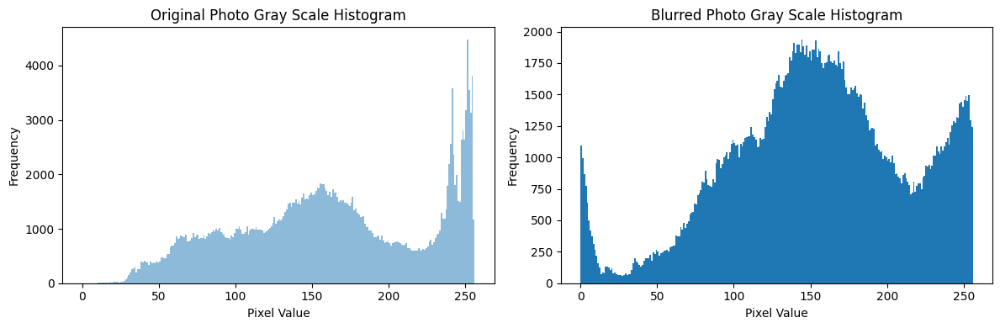

In [6]:
# Plot out the histogram for the original and the blurred

# Use the numpy arrays for the images
# Because the previous box ends with pillow form, not a numpy array, you need to convert it to np
# Renaming the converted_image_pixel.np to shorter version
orig_np = converted_image_pixel_np
blur_np = np.array(blurred_image)

# Plot and show the plotted histogram of the images
# fig, axes separates the histograms into 2
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12,4))

# Instead of plt, which will stack the histograms, use axes to plot separately
axes[0].hist(orig_np.ravel(), 256, (0, 256), alpha=0.5, label='Original')
axes[0].set_title('Original Photo Gray Scale Histogram')

axes[1].hist(blur_np.ravel(), 256, (0, 256), alpha=1, label='Blurred')
axes[1].set_title('Blurred Photo Gray Scale Histogram')

# Add labels and titles
for ax in axes:
    ax.set_xlabel('Pixel Value')
    ax.set_ylabel('Frequency')

# Ajust to make the layout better
plt.tight_layout()

# Show the histogram
plt.show()

In [14]:
# Use Scipy stats to determine any statistically significant difference and print out

# Import ttest_ind from scipy.stats for statistical significance
from scipy.stats import ttest_ind

# Perform a 2-tailed t-test
res_1 = ttest_ind(orig_np.ravel(), blur_np.ravel()).statistic
res_2 = ttest_ind(orig_np.ravel(), blur_np.ravel()).pvalue
res_3 = ttest_ind(orig_np.ravel(), blur_np.ravel()).df
print(f"Statistic: {res_1}, P-value: {res_2}, Degree of Freedom: {res_3}")

Statistic: 44.97512607661504, P-value: 0.0, Degree of Freedom: 499998.0
